# Interactive plotting with HoloViews

## Authors & Contributors

### Authors

- Pier Lorenzo Marasco, Provare LTD (UK), [@pl-marasco](https://github.com/pl-marasco)

### Contributors

- Alejandro Coca-Castro, The Alan Turing Institute (United Kingdom), [@acocac](https://github.com/acocac)
- Anne Fouilloux, Simula Research Laboratory (Norway), [@annefou](https://github.com/annefou)

<div class="alert alert-info">
<i class="fa-question-circle fa" style="font-size: 22px;color:#666;"></i> Overview
    <br>
    <br>
    <b>Questions</b>
    <ul>
        <li>How to clip Xarray DataSet with a shapefile to plot an area of interest?</li>
        <li>How to generate interactive maps with Holoviews?</li>
        <li>How to browse multiple times with Holoviews interactive maps?</li>
        <li>How to generate an interactive 1D plot with Holoviews?</li>
    </ul>
    <b>Objectives</b>
    <ul>
        <li>Learn about Holoviews and Xarray for creating interactive plots</li>
        <li>Learn to create interactive maps with Holoviews</li>
        <li>Learn to create multiple interactive plots with holoviews</li>
        <li>Learn to create a 1D line plot with holoviews</li>
    </ul>
</div>

## Context


We will be using [HoloViews](https://holoviews.org/), a tool part of the [HoloViz](https://holoviz.org/) ecosystem, with Xarray to visualize the Vegetation Condition Index (VCI) {cite:ps}`b-kogan1995-VCI`, a well-established indicator to estimate droughts from remote sensing data.

### Data

Data will be downloaded from zenodo using `pooch`, a very handy python-based library to download and cache your data files locally (see further info [here](https://www.fatiando.org/pooch/latest/index.html)).

In [8]:
import pooch

cgls_file = pooch.retrieve(
    url="https://zenodo.org/record/6969999/files/C_GLS_NDVI_20220101_20220701_Lombardia_S3_2_masked.nc",
    known_hash="md5:be3f16913ebbdb4e7af227f971007b22",
    path=f".",
)

## Setup

This episode uses the following main Python packages:

- xarray {cite:ps}`b-xarray-hoyer2017` with [`netCDF4`](https://pypi.org/project/h5netcdf/) and [`h5netcdf`](https://pypi.org/project/h5netcdf/) engines
- pooch {cite:ps}`b-pooch-Uieda2020`
- rioxarray {cite:ps}`b-rioxarray-snow2022`
- matplotlib {cite:ps}`b-matplotlib-Hunter2007`
- cartopy {cite:ps}`b-cartopy-mo2010`
- hvplot {cite:ps}`b-holoviews-rudiger2020`
- geopandas {cite:ps}`b-geopandas-jordahl2020`

Please install these packages if not already available in your Python environment.

### Packages

In this episode, Python packages are imported when we start to use them. However, for best software practices, we recommend you to install and import all the necessary libraries at the top of your Jupyter notebook.

In [9]:
import xarray as xr

## Open local dataset

In [10]:
cgls_ds = xr.open_dataset(cgls_file)

:::{tip}
If you get an error with the previous command, check the input file some_hash-C_GLS_NDVI_20220101_20220701_Lombardia_S3_2_masked.netcdf is downloaded locally and it is in the same directory as your Jupyter Notebook.
:::

In [11]:
cgls_ds

<xarray.Dataset>
Dimensions:  (time: 20, lon: 984, lat: 612)
Coordinates:
  * time     (time) datetime64[ns] 2022-01-01 2022-01-11 ... 2022-07-11
  * lon      (lon) float64 8.502 8.505 8.508 8.511 ... 11.42 11.42 11.42 11.43
  * lat      (lat) float64 46.5 46.5 46.49 46.49 ... 44.69 44.69 44.68 44.68
Data variables:
    NDVI     (time, lat, lon) float64 ...

## Clipping data according to a polygon

One of the basic concepts in GIS is to clip data using a vector geometry. Xarray is not directly capable of dealing with vectors but thanks to Rioxarray that can be easily achieved.
Rioxarray extends Xarray with most of the features that Rasterio (GDAL) brings.

## Read a shapefile with the Area Of Interest (AOI)

In [12]:
import geopandas as gpd

We define the area of interest using the Global Administrative Unit Layers from [ASAP - Anomaly Hotspots of Agricultural Production](https://agricultural-production-hotspots.ec.europa.eu/download.php).
[`GeoPandas`](https://geopandas.org/en/stable/), a python-based library extending the capabilities of [`Pandas`](https://pandas.pydata.org/) to deal with geometry and spatial operations, will help to manage geodata.

The full dataset is available at [https://agricultural-production-hotspots.ec.europa.eu/files/gaul1_asap_v04.zip](https://agricultural-production-hotspots.ec.europa.eu/files/gaul1_asap_v04.zip) but as the version may change and the dataset is quite big, we also created a tiny file containing information about Italy only for the training course

In [13]:
GAUL = gpd.read_file('Italy.geojson')

Data are organized in a tabular structure. For each element an index, data (made of columns) and a geometry are defined.

Geometries are defined through [shapely](https://shapely.readthedocs.io/en/stable/) geometry objects with three different basic classes:

- Points and Multi-Points
- Lines and Multi-Lines
- Polygons and Multi-Polygons

In [14]:
GAUL.head(5)

,asap1_id,name1,name1_shr,name0,asap0_id,name0_shr,km2_tot,km2_crop,km2_range,an_crop,an_range,water_lim,geometry
0,1172,Friuli-venezia Giulia,Friuli,Italy,172,Italy,7722,2995,1111,1,1,0,"POLYGON ((12.79517 46.64600, 12.80945 46.63482..."
1,1202,Calabria,Calabria,Italy,172,Italy,15203,7152,2127,1,1,1,"POLYGON ((16.42261 40.14416, 16.43624 40.12897..."
2,1204,Campania,Campania,Italy,172,Italy,13618,7376,2378,1,1,1,"POLYGON ((14.16099 41.48058, 14.16653 41.48039..."
3,1207,Abruzzi,Abruzzi,Italy,172,Italy,10797,4699,3300,1,1,1,"POLYGON ((13.91523 42.89441, 13.92206 42.85505..."
4,1211,Emilia-romagna,Emilia-romagna,Italy,172,Italy,22204,14958,771,1,1,1,"POLYGON ((12.49151 43.91780, 12.48442 43.90761..."


In the cell below, we subset the polygon geometry in which the `name1` field equals to `Lombardia`.

In [15]:
AOI_name = 'Lombardia'
AOI = GAUL[GAUL.name1 == AOI_name]
AOI_poly = AOI.geometry
AOI_poly

14    POLYGON ((10.23973 46.62177, 10.25084 46.61110...
Name: geometry, dtype: geometry

In a second step we set a EPSG:4326 Geodetic coordinate reference system to the polygon geometry. To achieve this we need to rely on rioxarray that extends xarray with the rasterio capabilities. The rio accessor is activated through importing rioxarray as has been done at the top.

In [16]:
cgls_ds.rio.write_crs(4326, inplace=True)

<xarray.Dataset>
Dimensions:      (time: 20, lon: 984, lat: 612)
Coordinates:
  * time         (time) datetime64[ns] 2022-01-01 2022-01-11 ... 2022-07-11
  * lon          (lon) float64 8.502 8.505 8.508 8.511 ... 11.42 11.42 11.43
  * lat          (lat) float64 46.5 46.5 46.49 46.49 ... 44.69 44.69 44.68 44.68
    spatial_ref  int64 0
Data variables:
    NDVI         (time, lat, lon) float64 ...

Once this has been done we can clip the data with the polygon that has been obtained through geopandas at the beginning of the notebook.

In [17]:
NDVI_AOI = cgls_ds.NDVI.rio.clip(AOI_poly, crs=4326)

## Visualize with matplotlib

In [18]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

Text(0.5, 1.0, 'S3 NDVI over Lombardia')

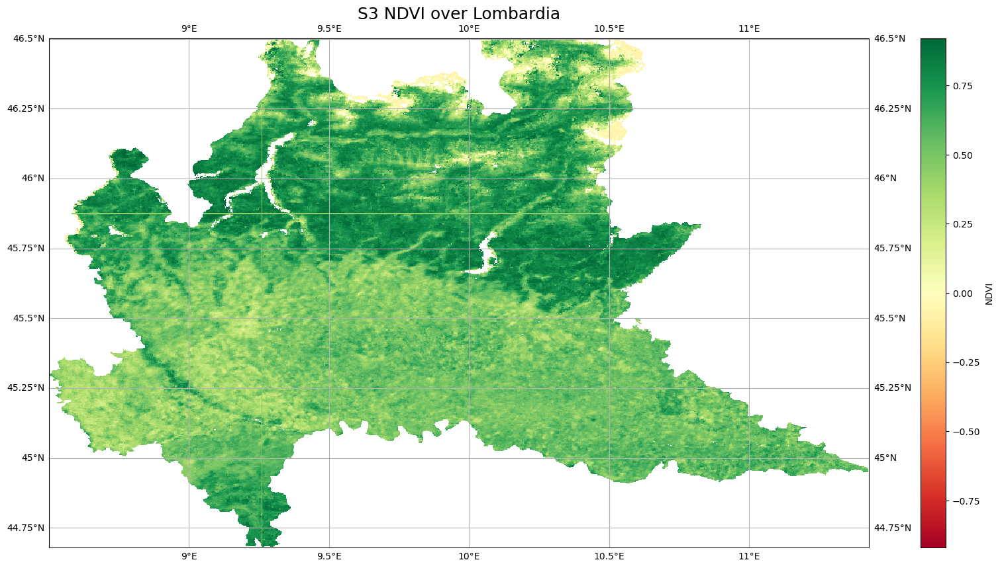

In [19]:
fig = plt.figure(1, figsize=[20, 10])

# We're using cartopy and are plotting in PlateCarree projection 
# (see documentation on cartopy)
ax = plt.subplot(1, 1, 1, projection=ccrs.PlateCarree())
#ax.set_extent([15.5, 27.5, 36, 41], crs=ccrs.PlateCarree()) # lon1 lon2 lat1 lat2
ax.coastlines(resolution='10m')
ax.gridlines(draw_labels=True)

NDVI_AOI.sel(time='2022-06-01').plot(ax=ax, transform=ccrs.PlateCarree(), cmap="RdYlGn")

# One way to customize your title
plt.title("S3 NDVI over Lombardia", fontsize=18)

## Visualization with HoloViews

In [20]:
import holoviews as hv
import hvplot.xarray
import hvplot.pandas

Plotting data through the HoloViews back-end thanks to the hvplot that acts as high-level plotting API.

In [21]:
NDVI_AOI.isel(time=0).hvplot(cmap="RdYlGn", width=1000, height=1000)

:Image   [lon,lat]   (NDVI)

Let's have a look at the data distribution.

In [22]:
NDVI_AOI[0].hvplot.hist(cmap="RdYlGn",bins=25, width=800, height=700)

:NdOverlay   [Element]
   :Histogram   [NDVI]   (NDVI_count)

### Multi-plots using groupby

To be able to visualize interactively all the different available times, we can use `groupby` time.

In [23]:
NDVI_AOI.hvplot(groupby ='time', cmap="RdYlGn", width=800, height=700)

:DynamicMap   [time]
   :Image   [lon,lat]   (NDVI)

We can add a histogram to the visualization.

In [24]:
NDVI_AOI.hvplot(groupby='time', cmap='RdYlGn', width=800, height=700 ).hist()

:AdjointLayout
   :DynamicMap   [time]
      :Image   [lon,lat]   (NDVI)
   :DynamicMap   [time]
      :Histogram   [NDVI]   (NDVI_count)

### Plot a time series

In [25]:
NDVI_AOI.sel(lat=45.88, lon=8.63, method='nearest').hvplot(ylim=(-0.08, 0.92))

:Curve   [time]   (NDVI)

<div class="alert alert-success">
    <i class="fa-check-circle fa" style="font-size: 22px;color:#666;"></i> <b>Key Points</b>
    <br>
    <ul>
        <li>Rioxarray for clipping over an area of interest</li>
        <li>Interactive plot with HoloViews and Xarray</li>
    </ul>
</div>

## References

```{bibliography}
:style: alpha
:filter: topic % "visualization" and not topic % "package"
:keyprefix: b-
```

## Packages citation

```{bibliography}
:style: alpha
:filter: topic % "visualization" and topic % "package"
:keyprefix: b-
```